This repo is for our paper *Nonlinear Polarization Modeling via Dual-Threshold Diffusion-Evolution Dynamics*, which is an opinion-evolution dynamics framework that couples diffusion models with evolutionary algorithms and is driven by a dual-threshold social-cognition mechanism. In the diffusion stage the framework continuously generates diverse opinions and, guided by a consensus-fitness function, highlights mainstream high-value views; in the denoising stage evolutionary selection preserves the fittest opinions and injects controllable perturbations to break information bubbles.

100%|██████████| 79/79 [00:00<00:00, 127.25it/s]


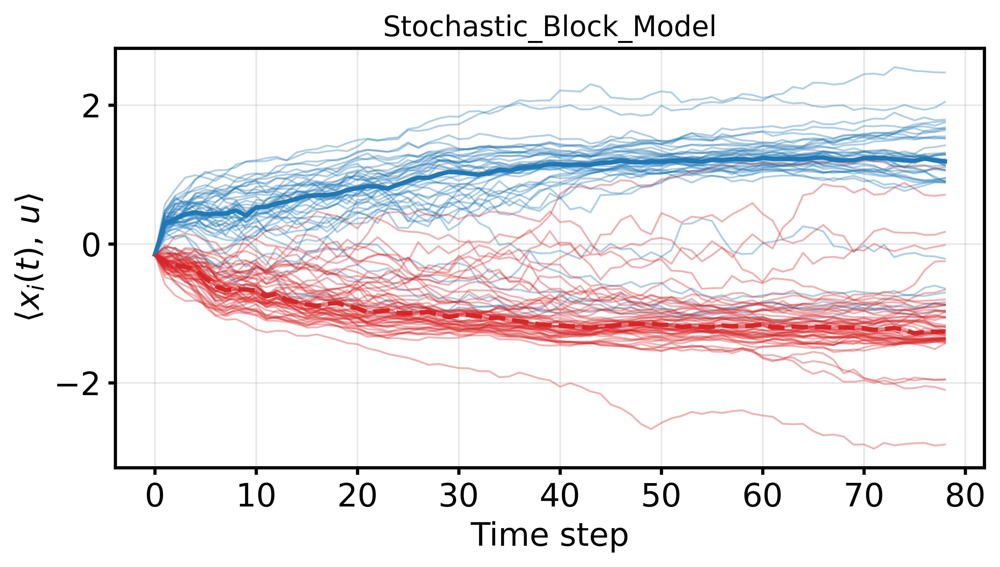

100%|██████████| 79/79 [00:00<00:00, 354.57it/s]


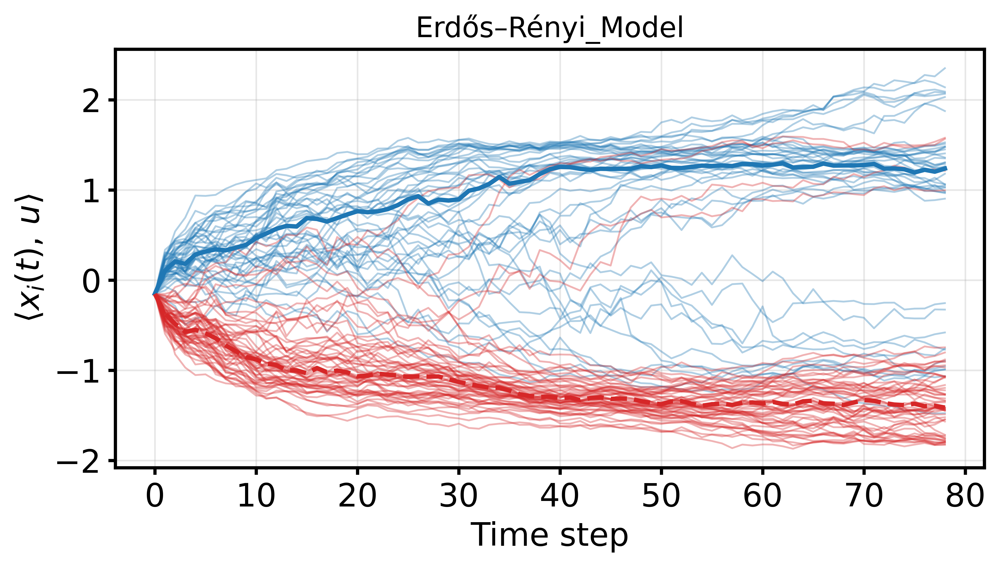

100%|██████████| 79/79 [00:00<00:00, 451.76it/s]


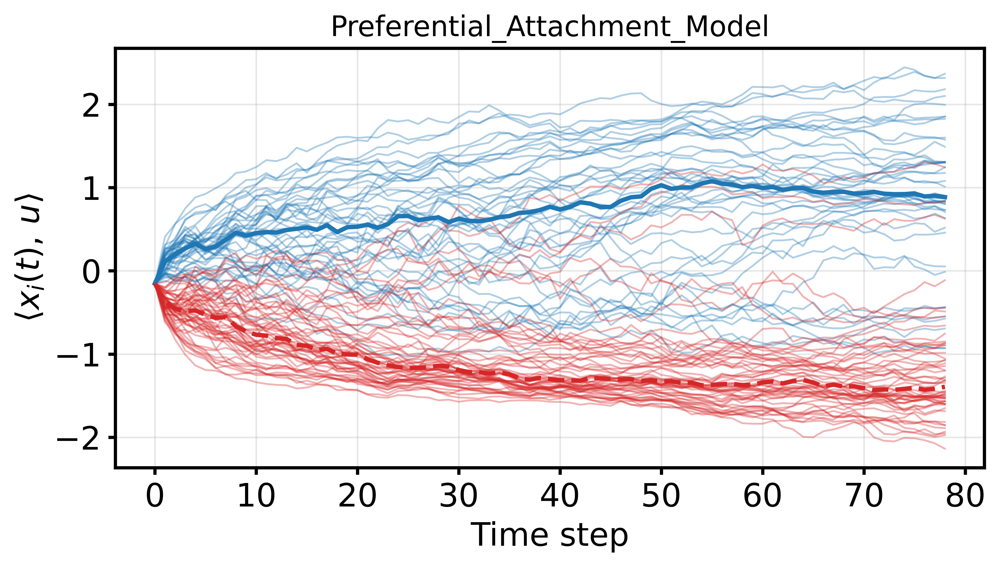

100%|██████████| 79/79 [00:00<00:00, 411.08it/s]


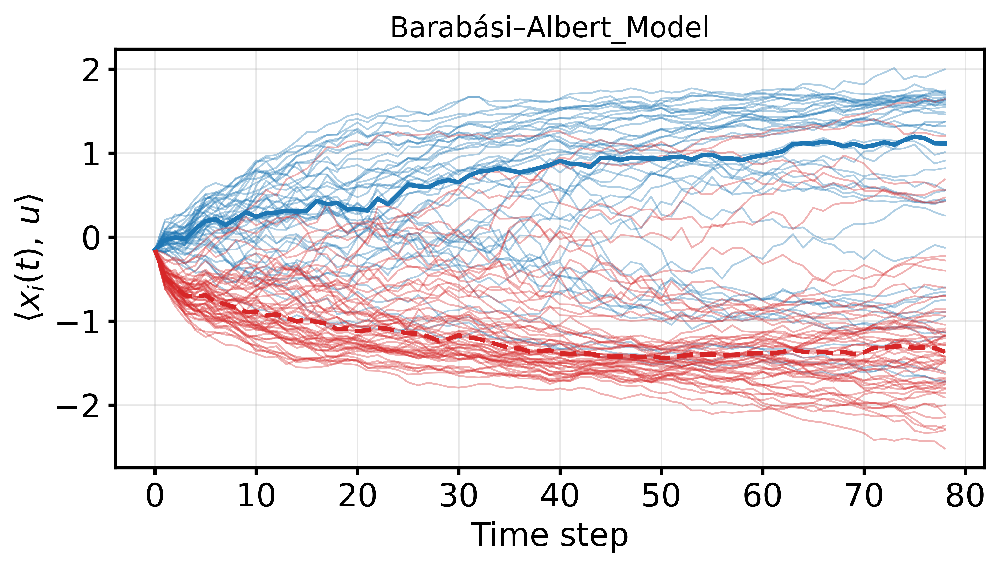

In [21]:
import os, csv, random
import numpy as np
import torch
import networkx as nx
import matplotlib.pyplot as plt
from tqdm import tqdm
from scipy.stats import skew, kurtosis
from sklearn.mixture import GaussianMixture

plt.rcParams['axes.edgecolor']      = 'black'  # Axis border color
plt.rcParams['axes.linewidth']      = 1.6      # Axis border linewidth
plt.rcParams['xtick.major.width']   = 1.6      # X-axis tick linewidth
plt.rcParams['ytick.major.width']   = 1.6      # Y-axis tick linewidth
plt.rcParams['legend.frameon']      = True     # Enable legend frame
plt.rcParams['legend.edgecolor']    = 'black'  # Legend frame border color
plt.rcParams['legend.framealpha']   = 0.5      # Legend frame opacity
plt.rcParams['legend.borderaxespad'] = 1.5     # Padding between legend and axes

plt.rcParams['font.size']        = 16   # Default font size
plt.rcParams['axes.titlesize']   = 18   # Title size
plt.rcParams['axes.labelsize']   = 16   # Axis label size
plt.rcParams['xtick.labelsize']  = 16   # X-axis tick label size
plt.rcParams['ytick.labelsize']  = 16   # Y-axis tick label size
plt.rcParams['legend.fontsize']  = 16   # Legend font size

plt.rcParams['legend.title_fontsize'] = 13

# ========== Device ==========
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ========== Utility functions ==========
def compute_ashman_d(opinions, use_dim=0, random_state=0):
    if isinstance(opinions, torch.Tensor):
        opinions = opinions.detach().cpu().numpy()
    x = opinions[:, use_dim].reshape(-1, 1)
    gmm = GaussianMixture(n_components=2, covariance_type='full', random_state=random_state)
    gmm.fit(x)
    mu = gmm.means_.flatten()
    var = gmm.covariances_.flatten()
    sigma = np.sqrt(var)
    D = np.abs(mu[0] - mu[1]) / np.sqrt(sigma[0]**2 + sigma[1]**2 + 1e-12)
    return D

def save_results_to_csv(results, file_path='results.csv'):
    with open(file_path, mode='w', newline='') as f:
        w = csv.writer(f)
        w.writerow(['Network Type', 'Param', 'BC', 'Entropy', 'Coverage', 'Dynamic Coverage'])
        w.writerows(results)

# ========== Network generation ==========
def preferential_attachment_custom(n, m):
    if m < 1 or m >= n:
        raise ValueError("m must 1 <= m < n")
    G = nx.complete_graph(m)
    for new_node in range(m, n):
        nodes = list(G.nodes)
        degrees = [G.degree(u) for u in nodes]
        degree_sum = sum(degrees)
        probs = [deg / degree_sum for deg in degrees]
        targets = random.choices(nodes, weights=probs, k=m)
        G.add_node(new_node)
        for t in targets:
            G.add_edge(new_node, t)
    return G

def generate_social_network(n_agents, network_type='small_world', **kwargs):
    if network_type == 'random':
        G = nx.erdos_renyi_graph(n_agents, kwargs.get('p', 0.1))
    elif network_type == 'small_world':
        G = nx.watts_strogatz_graph(n=n_agents, k=kwargs.get('k', 4), p=kwargs.get('p', 0.1))
    elif network_type == 'scale_free':
        G = nx.barabasi_albert_graph(n=n_agents, m=kwargs.get('m', 2))
    elif network_type == 'Stochastic_Block_Model':
        sizes = [n_agents // 2, n_agents // 2]
        p_matrix = [[0.7, 0.1],[0.1, 0.7]]
        G = nx.stochastic_block_model(sizes, p_matrix)
    elif network_type == 'Erdős–Rényi_Model':
        G = nx.erdos_renyi_graph(n_agents, 0.2)
    elif network_type == 'Preferential_Attachment_Model':
        G = preferential_attachment_custom(n_agents, 5)
    elif network_type == 'Barabási–Albert_Model':
        G = nx.barabasi_albert_graph(n_agents, 5)
    else:
        raise ValueError(f"Unknown network_type: {network_type}")

    adj = torch.tensor(nx.to_numpy_array(G), dtype=torch.float32, device=device)
    adj = adj / adj.sum(dim=1, keepdim=True).clamp(min=1)  # Row normalization to avoid division by zero
    return adj, G

# ========== Initialization: bimodal Gaussian ==========
def sample_bimodal(n, mu1=(-1.0,-1.0), mu2=(1.0,1.0), sigma=0.3, p=0.5, device='cpu', seed=2025):
    g = torch.Generator(device=device).manual_seed(seed)
    comp = (torch.rand((n, 1), device=device, generator=g) < p).float()
    mu1_t = torch.tensor(mu1, device=device).float()
    mu2_t = torch.tensor(mu2, device=device).float()
    means = comp * mu2_t + (1-comp) * mu1_t
    return means + sigma * torch.randn(n, 2, device=device, generator=g)

# ========== Objective / density function ==========
def opinion_density_with_network(opinions, tau=1.0, perceived_consensus=1.0):
    c1 = torch.tensor([-1., -1.], device=opinions.device)
    c2 = torch.tensor([ 1.,  1.], device=opinions.device)
    d1 = torch.norm(opinions - c1, dim=1)
    d2 = torch.norm(opinions - c2, dim=1)
    dens = 0.5*torch.exp(-tau*d1**2) + 0.5*torch.exp(-tau*d2**2)
    return perceived_consensus * dens

def g(f, lam=1.0):
    return torch.exp(lam * f)                # 或 torch.nn.functional.softplus(f)

# ========== Optimizer (Opinion Evolution) ========== Algorithm 2 start
def optimizer(fit_fn, initial_population, adj_matrix, scaling=1.0, noise=0.1, num_step=100, prejudice_level=1.0):
    x = initial_population.to(device)
    fitness_count = []
    population_trace = [initial_population.to(device)]
    x0_trace = []
    scheduler = DDIMScheduler(num_step)

    for t, alpha in tqdm(scheduler):
        fitness = fit_fn(x * scaling)
        generator = BayesianGenerator(x, fitness, alpha, adj_matrix, prejudice_level)
        x, x0 = generator(noise=noise, return_x0=True)
        x0_trace.append(x0)
        population_trace.append(x)
        fitness_count.append(fitness)

    population_trace = torch.stack(population_trace).to(device) * scaling
    x0_trace = torch.stack(x0_trace).to(device) * scaling
    return (x * scaling, population_trace, fitness_count), x0_trace, scheduler

# ========== Metrics ==========
def compute_bimodality_coefficient(opinions):
    if isinstance(opinions, torch.Tensor):
        opinions = opinions.detach().cpu().numpy()
    x = opinions[:, 0]
    n = len(x)
    if n < 4:
        raise ValueError("Insufficient number of samples to calculate the Bimodality Coefficient (BC); at least n ≥ 4 is required.")
    sk = skew(x)
    ku = kurtosis(x, fisher=True)
    bc = (sk**2 + 1) / (ku + (3 * (n - 1)**2) / ((n - 2) * (n - 3)))
    return bc

def calculate_entropy(opinions, bins=30):
    if isinstance(opinions, torch.Tensor):
        opinions = opinions.detach().cpu().numpy()
    hist, x_edges, y_edges = np.histogram2d(opinions[:,0], opinions[:,1], bins=bins, density=True)
    p = hist.flatten()
    p = p[p > 0]
    return -np.sum(p * np.log(p))

def calculate_coverage(opinions, bins=10):
    if isinstance(opinions, torch.Tensor):
        opinions = opinions.detach().cpu().numpy()
    hist, _, _ = np.histogram2d(opinions[:,0], opinions[:,1], bins=bins)
    return np.count_nonzero(hist) / (bins * bins)

# ========== Main simulation wrapper ==========
def opinion_optimizer_with_network(network_type='Stochastic_Block_Model',
                                   n_agents=1000,
                                   perceived_consensus=1.0,
                                   prejudice_level=1.0,
                                   scaling=0.8, noise=0.5, num_step=80, tau=1.0,
                                   init_mode='bimodal', init_sigma=0.3, init_seed=2025,
                                   **network_kwargs):
    adj_matrix, social_graph = generate_social_network(n_agents, network_type, **network_kwargs)

    # Initial state: bimodal Gaussian by default
    if init_mode == 'bimodal':
        x0 = sample_bimodal(n_agents, sigma=init_sigma, device=device, seed=init_seed)
    elif init_mode == 'normal':
        x0 = torch.randn(n_agents, 2, device=device)
    else:
        raise ValueError(f"Unknown init_mode: {init_mode}")

    def density_func(x):
        return opinion_density_with_network(x, tau, perceived_consensus)

    result, x0_trace, scheduler = optimizer(
        fit_fn=density_func,
        initial_population=x0,
        prejudice_level=prejudice_level,
        adj_matrix=adj_matrix,
        scaling=scaling,
        noise=noise,
        num_step=num_step
    )

    final_opinions = result[0]
    bc = compute_bimodality_coefficient(final_opinions)
    entropy = calculate_entropy(final_opinions)
    coverage = calculate_coverage(final_opinions)

    dynamic_coverage = []
    dynamic_entropy  = []
    for trace in x0_trace:
        arr = trace.detach().cpu().numpy()
        dynamic_coverage.append(calculate_coverage(arr))
        dynamic_entropy.append(calculate_entropy(arr))

    return result, x0_trace, scheduler, social_graph, adj_matrix, bc, entropy, dynamic_entropy, coverage, dynamic_coverage

# ========== Plot only "individual trajectories" ==========
def plot_individual_trajectories_scalar(x0_trace, out_dir, tag,
                                        K=100, seed=2025, downsample=1,
                                        centers=((-1,-1),(1,1)), x_init=None):
    """
    Individual opinions over time (projected onto the line connecting the two camps):
    - Blue/Red: grouped by the "initial projection" (≥0 / <0)
    - For each camp: median (blue solid / red dashed) + 10–90% quantile band
    - Background: randomly sample K individual polylines
    """
    X = x0_trace.detach().cpu().numpy()            # (T, N, 2)
    T, N, D = X.shape
    t_idx = np.arange(0, T, downsample)
    Xd = X[t_idx]

    mu1 = np.array(centers[0], dtype=float)
    mu2 = np.array(centers[1], dtype=float)
    u = (mu2 - mu1) / np.linalg.norm(mu2 - mu1)

    s = Xd @ u                                     # (T', N)

    # — Group by the true "initial" frame (fallback to first frame if not provided) —
    if x_init is not None:
        x_init_np = x_init.detach().cpu().numpy()  # (N, 2)
        s_init = x_init_np @ u
    else:
        s_init = s[0, :]

    idx_blue_all = np.where(s_init >= 0)[0]
    idx_red_all  = np.where(s_init <  0)[0]

    # Extreme fallback: if one side is empty, regroup using the final frame
    if len(idx_blue_all) == 0 or len(idx_red_all) == 0:
        s_final = s[-1, :]
        idx_blue_all = np.where(s_final >= 0)[0]
        idx_red_all  = np.where(s_final <  0)[0]

    # Stratified sampling to ensure both sides are represented
    rng = np.random.default_rng(seed)
    K = min(K, N)
    k_b = min(len(idx_blue_all), K//2)
    k_r = min(len(idx_red_all),  K - k_b)
    idx = np.concatenate([
        rng.choice(idx_blue_all, size=k_b, replace=False) if k_b>0 else np.array([], int),
        rng.choice(idx_red_all,  size=k_r, replace=False) if k_r>0 else np.array([], int)
    ])

    fig, ax = plt.subplots(figsize=(7.2, 4.2), dpi=600)
    # Individual polylines
    for i in idx:
        col = '#1f77b4' if i in idx_blue_all else '#d62728'
        ax.plot(t_idx, s[:, i], lw=0.9, alpha=0.35, color=col)

    def qband(mat):
        if mat.shape[1] == 0:
            return None, None, None
        return (np.quantile(mat, 0.10, axis=1),
                np.quantile(mat, 0.50, axis=1),
                np.quantile(mat, 0.90, axis=1))

    blue_mat = s[:, idx_blue_all] if len(idx_blue_all)>0 else np.zeros((len(t_idx),0))
    red_mat  = s[:, idx_red_all]  if len(idx_red_all)>0  else np.zeros((len(t_idx),0))

    b10,b50,b90 = qband(blue_mat)
    r10,r50,r90 = qband(red_mat)

    # Blue camp: band + median line
    if b50 is not None:
        ax.plot(t_idx, b50, color='#1f77b4', lw=2.2, linestyle='-',  label='Blue median')
    # Red camp: band + median line
    if r50 is not None:
        ax.plot(t_idx, r50, color='#d62728', lw=2.2, linestyle='--', label='Red median')
    ax.set_title(f'{tag}', fontsize=14, pad=6)
    ax.set_xlabel('Time step')
    ax.set_ylabel(r'$\langle x_i(t),\,u\rangle$')
    ax.grid(alpha=0.3)
    fig.tight_layout()
    os.makedirs(out_dir, exist_ok=True)
    fig.savefig(os.path.join(out_dir, f'{tag}_traj_scalar.png'), dpi=600)
    plt.show()
    plt.close(fig)

def visualize_opinion_trajectories_only(
        network_types=('Stochastic_Block_Model','Erdős–Rényi_Model','Preferential_Attachment_Model','Barabási–Albert_Model'),
        perceived_consensus= [2.0], #beta perceived_consensus
        prejudice_level=1.0,
        plot_path='individual',
        n_agents=100,
        scaling=0.8, noise=0.5, num_step=80, tau=0.1,
        init_mode='bimodal', init_sigma=0.3, init_seed=2025,
        centers=((-1,-1),(1,1)),
        K=100, seed=2025, downsample=1,
        **network_kwargs):

    os.makedirs(plot_path, exist_ok=True)
    for net in network_types:
        for lam in perceived_consensus:
            (result, x0_trace, scheduler,
             social_graph, adj_matrix, bc, entropy, dynamic_entropy, coverage, dynamic_coverage) = \
                opinion_optimizer_with_network(
                    network_type=net,
                    n_agents=n_agents,
                    perceived_consensus=lam,
                    prejudice_level=prejudice_level,
                    scaling=scaling, noise=noise, num_step=num_step, tau=tau,
                    init_mode=init_mode, init_sigma=init_sigma, init_seed=init_seed,
                    **network_kwargs
                )

            pop, pop_trace, fitnesses = result
            x_init = pop_trace[0]

            #safe_param = str(lam).replace('.', 'p')
            #tag = f'{net}_{safe_param}'
            tag = f'{net}'
            plot_individual_trajectories_scalar(
                x0_trace, out_dir=plot_path, tag=tag,
                K=K, seed=seed, downsample=downsample, centers=centers, x_init=x_init
            )

if __name__ == '__main__':
    visualize_opinion_trajectories_only()


In [20]:
import torch
import numpy as np


class DDIMScheduler:
    """
    DDIMScheduler is a scheduler for the DDIM algorithm.

    Args:
        num_step: int, the number of steps for the DDIM algorithm

    Iters:
        t: int, the current time step.
        alpha: float, the current value of alpha.
        alpha_past: float, the previous value of alpha

    Example:
        scheduler = DDIMScheduler(num_step=100)
        for t, alpha, alpha_past in scheduler:
            # do something with t, alpha, and alpha_past
    """
    def __init__(self, num_step, power=1, eps=1e-4):
        self.num_step = num_step
        self.power = power
        self.alpha = torch.linspace(1 - eps, (eps*eps) ** (1 / self.power), num_step) ** self.power
        self.index = 0

    def __next__(self):
        if self.index >= self.num_step - 1:
            raise StopIteration

        t = self.num_step - self.index - 1
        alpha = self.alpha[t]
        alpha_past = self.alpha[t - 1]
        self.index += 1
        return t, (alpha, alpha_past)

    def __len__(self):
        return self.num_step - 1

    def __iter__(self):
        self.index = 0
        return self



class DDPMScheduler(DDIMScheduler):
    """
    DDPMScheduler is a scheduler for the DDPM algorithm.
    """
    def __init__(self, num_step, eps=1e-4):
        """Approximate the alpha schedule of DDPM.

        Approximation:
            Given β_t = β₀ + γt, and α_t = prod_{s=1}^t (1 - β_s), we can approximate ln(α_t) as follows:

            ln(α_t) ≈ ∫[s=1 to t] ln(1-β₀-γs) ds ≈ T ∫[0 to t/T] (-β₀-γu) du

            --> α_t ≈ exp(-β₀ t - γ t² / 2T)

            Convert t from [1, num_step] to [1/num_step, 1], we got a general form:
            --> α_t ≈ exp(-β t - γ t²)

        Args:
            num_step: int, the number of steps for the DDPM algorithm
            alpha_min: float, the minimum value of alpha
        """
        super().__init__(num_step)
        # ensure alpha[0] = 1 - eps, and alpha[-1] = eps
        beta = ((num_step ** 2) * np.log(1 / (1 - eps)) + np.log(eps)) / (num_step - 1)
        gamma = - num_step * (num_step * np.log(1 / (1-eps)) + np.log(eps)) / (num_step - 1)
        t = torch.linspace(1.0 / num_step, 1.0, num_step)
        self.alpha = torch.exp(-beta * t - gamma * t.square())


In [19]:
import torch
import torch.nn as nn


class BayesianEstimator:
    """Bayesian Estimator of the origin points, based on current samples and fitness values."""

    def __init__(self, x: torch.tensor, fitness: torch.tensor, alpha, density='uniform', h=0.1, device=None):
        self.device = device or torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.x = x.to(self.device)
        self.fitness = fitness.to(self.device)
        self.alpha = alpha
        self.density_method = density
        self.h = h
        if not density in ['uniform', 'kde']:
            raise NotImplementedError(f'Density estimator {density} is not implemented.')

    def append(self, estimator):
        self.x = torch.cat([self.x, estimator.x], dim=0)
        self.fitness = torch.cat([self.fitness, estimator.fitness], dim=0)

    def density(self, x):
        if self.density_method == 'uniform':
            return torch.ones(x.shape[0], device=self.device) / x.shape[0]
        elif self.density_method == 'kde':
            return KDE(x, h=self.h).to(self.device)

    @staticmethod
    def norm(x):
        if x.shape[-1] == 1:
            # for some reason, torch.norm becomes very slow when dim=1, so we use torch.abs instead
            return torch.abs(x).squeeze(-1)
        else:
            return torch.norm(x, dim=-1)

    def gaussian_prob(self, x, mu, sigma):
        dist = self.norm(x - mu)
        return torch.exp(-(dist ** 2) / (2 * sigma ** 2))

    def _estimate(self, x_t, p_x_t):
        # diffusion probability, P = N(x_t; \sqrt{α_t}x,\sqrt{1-α_t})
        mu = self.x * (self.alpha ** 0.5)
        sigma = (1 - self.alpha) ** 0.5
        p_diffusion = self.gaussian_prob(x_t, mu, sigma)

        # estimate the origin
        prob = (self.fitness + 1e-9) * (p_diffusion + 1e-9) / (p_x_t + 1e-9)
        z = torch.sum(prob)
        origin = torch.sum(prob.unsqueeze(1) * self.x, dim=0) / (z + 1e-9)

        return origin

    def estimate(self, x_t):
        p_x_t = self.density(x_t)
        origin = torch.vmap(self._estimate, (0, 0))(x_t, p_x_t)
        return origin

    def __call__(self, x_t):
        return self.estimate(x_t)

    def __repr__(self):
        return f'<BayesianEstimator {len(self.x)} samples>'


def social_guidance(x_t, adj_matrix, c, gamma_max=1.0, eps=1e-9):
    # x_t: (N, d)
    x_norm = x_t / (x_t.norm(dim=1, keepdim=True) + eps)
    cos_sim = x_norm @ x_norm.t()                        # (N,N)
    W = torch.exp(c * cos_sim) * adj_matrix
    W = W / (W.sum(dim=1, keepdim=True) + eps)
    g = W @ x_t - x_t
    gamma = gamma_max * (1.0 - c)
    return gamma * g                                     # (N,d)



def ddim_step(xt, x0, alphas: tuple, noise: float = None, device=None):
    """One step of the DDIM algorithm.

    Args:
    - xt: torch.Tensor, shape (n, d), the current samples.
    - x0: torch.Tensor, shape (n, d), the estimated origin.
    - alphas: tuple of two floats, alpha_{t} and alpha_{t-1}.

    Returns:
    - x_next: torch.Tensor, shape (n, d), the next samples.
    """
    alphat, alphatp = alphas
    sigma = ddpm_sigma(alphat, alphatp) * noise
    eps = (xt - (alphat ** 0.5) * x0) / (1.0 - alphat) ** 0.5
    if sigma is None:
        sigma = ddpm_sigma(alphat, alphatp)
    x_next = (alphatp ** 0.5) * x0 + ((1 - alphatp - sigma ** 2) ** 0.5) * \
             eps + sigma * torch.randn_like(x0, device=device)
    return x_next


def ddpm_sigma(alphat, alphatp):
    """Compute the default sigma for the DDPM algorithm."""
    return ((1 - alphatp) / (1 - alphat) * (1 - alphat / alphatp)) ** 0.5


class BayesianGenerator:
    """Bayesian Generator for the DDIM algorithm."""

    def __init__(self, x, fitness, alpha, adj_matrix, prejudice_level,density='uniform', h=0.1, device=None):
        self.device = device or torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.x = x.to(self.device)
        self.fitness = fitness.to(self.device)
        self.alpha, self.alpha_past = alpha
        self.estimator = BayesianEstimator(self.x, self.fitness, self.alpha, density=density, h=h, device=self.device)
        self.adj_matrix = adj_matrix
        self.prejudice_level = prejudice_level

    def generate(self, noise=1.0, return_x0=False):
        x0_est = self.estimator(self.x)
        x_next = ddim_step(self.x, x0_est, (self.alpha, self.alpha_past), noise=noise, device=self.device)
        x_next = x_next + social_guidance(x_next, self.adj_matrix, c=self.prejudice_level)
        if return_x0:
            return x_next, x0_est
        else:
            return x_next

    def __call__(self, noise=1.0, return_x0=False):
        return self.generate(noise=noise, return_x0=return_x0)




In [18]:
import torch


def distance_matrix(x, y):
    """Compute the pairwise distance matrix between x and y.

    Args:
        x: (N, d) tensor.
        y: (M, d) tensor.
    Returns:
        (N, M) tensor, the pairwise distance matrix.
    """
    return torch.cdist(x, y)

def KDE(samples, h=0.1):
    """Modified Kernel Density Estimation (KDE) method, which only estimate the density at the given samples.

    Args:
        samples: (N, d) tensor, the samples to estimate the density.
        h: float, the bandwidth.
    Returns:
        (N,) tensor, the estimated density at the given samples.
    """
    distances = distance_matrix(samples, samples) # (N, N)
    weights = torch.exp(-(distances ** 2) / (2 * h**2)) # (N,)
    weights = weights.sum(dim=-1)
    return weights / sum(weights) * samples.shape[0]

In [11]:
# Algorithm 1
import torch, torch.nn as nn, math, networkx as nx

def make_alpha_bar(T, device):
    t = torch.linspace(0, T, T+1, device=device)
    ab = torch.cos((t/T)*math.pi/2)**2
    return (ab/ab[0]).clamp(1e-6, 1.0)

class GCNLayer(nn.Module):
    def __init__(self, in_dim, out_dim):
        super().__init__()
        self.lin = nn.Linear(in_dim, out_dim)
    def forward(self, X, A):  # A: [B, n, n], X: [B, n, d]
        return torch.bmm(A, X) @ self.lin.weight.T + self.lin.bias

class EpsilonGCN(nn.Module):
    def __init__(self, d, hidden=128, t_embed_dim=64):
        super().__init__()
        self.t_embed = nn.Embedding(1024, t_embed_dim)

        # GCN
        self.g1 = GCNLayer(d + t_embed_dim, hidden)
        self.g2 = GCNLayer(hidden, hidden)
        self.g3 = GCNLayer(hidden, hidden)

        self.out = nn.Linear(hidden, d)
        self.act = nn.ReLU()

    def forward(self, x_t, A, t_int):
        B, N, d = x_t.shape
        t_e = self.t_embed(t_int.clamp_max(1023))  # [B, t_dim]
        t_e = t_e.unsqueeze(1).expand(B, N, -1)
        X = torch.cat([x_t, t_e], dim=-1)

        X = self.act(self.g1(X, A))
        X = self.act(self.g2(X, A))
        X = self.act(self.g3(X, A))

        return self.out(X)

def sample_graph(n, p=0.2):
    import numpy as np
    g = nx.erdos_renyi_graph(n, p)
    A = torch.tensor(nx.to_numpy_array(g), dtype=torch.float32)
    A = A / (A.sum(1, keepdim=True)+1e-9)
    return A

def sample_batch_graphs(B, n, device):
    return torch.stack([sample_graph(n) for _ in range(B)], dim=0).to(device)

def sample_x0_batch(B, n, d, mu=2.0, sigma=0.5, device="cpu"):
    comp = torch.randint(0, 2, (B, n, 1), device=device, dtype=torch.float32)
    means = torch.where(comp>0, mu, -mu)
    x0 = means.expand(-1, -1, d) + sigma*torch.randn(B, n, d, device=device)
    return x0

def train_eps_theta(n=100, d=2, T=80, iters=10000, lr=1e-3, B=8, device="cpu"):
    ab = make_alpha_bar(T, device)
    net = EpsilonGCN(d).to(device)
    opt = torch.optim.Adam(net.parameters(), lr=lr)

    for it in range(1, iters+1):
        A = sample_batch_graphs(B, n, device)
        x0 = sample_x0_batch(B, n, d, device=device)
        t  = torch.randint(1, T+1, (B,), device=device)
        eps = torch.randn(B, n, d, device=device)

        beta_t = ab[t].view(B, 1, 1)
        xt = beta_t.sqrt()*x0 + (1-beta_t).sqrt()*eps

        eps_hat = net(xt, A, t)
        loss = (eps_hat - eps).pow(2).mean()

        opt.zero_grad(); loss.backward(); opt.step()
        if it % 500 == 0:
            print(f"iter {it}: loss={loss.item():.4f}")
    return net

if __name__ == "__main__":
    device = "cuda" if torch.cuda.is_available() else "cpu"
    _ = train_eps_theta(device=device)


iter 500: loss=0.9799
iter 1000: loss=1.0289
iter 1500: loss=1.0176
iter 2000: loss=0.9760
iter 2500: loss=1.0464
iter 3000: loss=0.9641
iter 3500: loss=1.0445
iter 4000: loss=0.9969
iter 4500: loss=1.0222
iter 5000: loss=1.0806
iter 5500: loss=0.9697
iter 6000: loss=1.0179
iter 6500: loss=0.9932
iter 7000: loss=1.0283
iter 7500: loss=0.9242
iter 8000: loss=0.9936
iter 8500: loss=1.0480
iter 9000: loss=0.9305
iter 9500: loss=0.9500
iter 10000: loss=0.9981
